In [102]:
#  Fetch all the image file names using glob
#  Read all the images using cv2.imread()
#  Store all the images into a list
#  Create a VideoWriter object using cv2.VideoWriter()
#  Save the images to video file using cv2.VideoWriter().write()
#  Release the VideoWriter and destroy all windows.

import cv2
import numpy as np
import glob
import os
from IPython.display import Video
from collections import deque
from imutils.video import VideoStream
import argparse
# import cv2
import imutils
import time
path = '/home/mesonet/cam_photos/2019/06/08/VOOR/*.jpg'

In [103]:
sorted_lst = sorted(glob.glob(path))
# print(sorted_lst)

In [115]:
#path = '/home/arnold/raindrop-detection-cnn/mesonet/*.jpg'

img_array = []
#for count in range(len(os.listdir(path))):
#print(glob.glob(path))
for filename in sorted_lst:
#     filename = './path/mask_frame_' + str(count) + '.jpg'
    #filename = path + str(count) + '.jpg'
    #print(filename)
    img = cv2.imread(filename)
    #print(img)
    height, width, layers = img.shape
    size = (width,height)
    
    img_array.append(img)
print(size)
# out = cv2.VideoWriter('test_video.avi',cv2.VideoWriter_fourcc(*'DIVX'), 24, size)
#create video
video = cv2.VideoWriter('imgvideo.mp4',cv2.VideoWriter_fourcc(*'FMP4'), 24, size)

#add each image to video as frame
for i in range(len(img_array)):
    video.write(img_array[i])
video.release()

(1280, 720)


In [48]:
#Video(b'mygeneratedvideo.mp4', embed=True)

In [44]:
%%HTML
<video width="320" height="240" controls>
  <source src="/home/arnold/raindrop-detection-cnn/test_video.mp4" type="video/mp4">
</video>

In [109]:
Video("/home/arnold/raindrop-detection-cnn/video_wdir.mp4", embed=True)

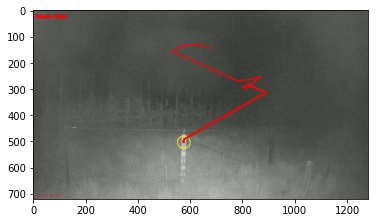

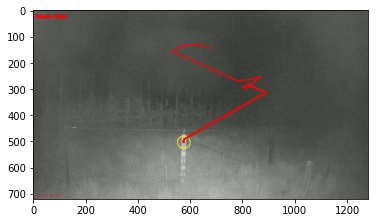

In [116]:
import cv2
import matplotlib.pyplot as plt
from IPython import display
%matplotlib inline

cap = cv2.VideoCapture("/home/arnold/raindrop-detection-cnn/video_wdir.mp4")

while(cap.isOpened()):
    try:
        ret, frame = cap.read()
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        plt.imshow(frame)

        display.clear_output(wait=True)
        display.display(plt.gcf())

    except KeyboardInterrupt:
        cap.release()

In [ ]:
#path = '/home/arnold/raindrop-detection-cnn/mesonet/*.jpg'
whiteUpper = (0,0,180)
whiteLower = (255,255,255)
lower_white = np.array([0,0,180])
higher_white = np.array([255,255,255])
pts = deque([], maxlen=32)
counter = 0
(dX, dY) = (0, 0)
direction = ""
img_array = []
#for count in range(len(os.listdir(path))):
#print(glob.glob(path))
for filename in sorted_lst[60:80]:
#     filename = './path/mask_frame_' + str(count) + '.jpg'
    #filename = path + str(count) + '.jpg'
    #print(filename)
    img = cv2.imread(filename)
    #print(img)
    height, width, layers = img.shape
    size = (width,height)
    frame = img 
    
    
    # grab the current frame
#     ret, frame = vs.read()
#     frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
#     plt.imshow(frame)
#   frame = vs.read()
    # handle the frame from VideoCapture or VideoStream
    #frame = frame[1] if args.get("video", False) else frame
#     plt.imshow(frame)
    # if we are viewing a video and we did not grab a frame,
    # then we have reached the end of the video
    
    if frame is None:
        break
#     print(frame)
    # resize the frame, blur it, and convert it to the HSV
    # color space
#     frame = imutils.resize(frame, width=600)
    blurred = cv2.GaussianBlur(frame, (11, 11), 0)
    hsv = cv2.cvtColor(blurred, cv2.COLOR_BGR2HSV)
    # construct a mask for the color "green", then perform
    # a series of dilations and erosions to remove any small
    # blobs left in the mask
    mask = cv2.inRange(hsv, lower_white, higher_white)
    mask = cv2.erode(mask, None, iterations=2)
    mask = cv2.dilate(mask, None, iterations=2)
    # find contours in the mask and initialize the current
    # (x, y) center of the ball
    cnts = cv2.findContours(mask.copy(), cv2.RETR_EXTERNAL,
        cv2.CHAIN_APPROX_SIMPLE)
    cnts = imutils.grab_contours(cnts)
    #print(len(cnts))
    center = None
        # only proceed if at least one contour was found
    #print(frame)
    if len(cnts) > 0:
        # find the largest contour in the mask, then use
        # it to compute the minimum enclosing circle and
        # centroid
        c = max(cnts, key=cv2.contourArea)
        ((x, y), radius) = cv2.minEnclosingCircle(c)
        M = cv2.moments(c)
        center = (int(M["m10"] / M["m00"]), int(M["m01"] / M["m00"]))
        # only proceed if the radius meets a minimum size
        #print(radius)
        if radius > 10:
            # draw the circle and centroid on the frame,
            # then update the list of tracked points
            cv2.circle(frame, (int(x), int(y)), int(radius),
                (0, 255, 255), 2)
            cv2.circle(frame, center, 5, (0, 0, 255), -1)
            pts.appendleft(center)
            #print(pts)
            	# loop over the set of tracked points
    for i in np.arange(1, len(pts)):
        # if either of the tracked points are None, ignore
        # them
        if pts[i - 1] is None or pts[i] is None:
            continue
        # check to see if enough points have been accumulated in
        # the buffer
        if counter >= 10 and i == 1 and pts[-5] is not None:
            # compute the difference between the x and y
            # coordinates and re-initialize the direction
            # text variables
            dX = pts[-5][0] - pts[i][0]
            dY = pts[-5][1] - pts[i][1]
            (dirX, dirY) = ("", "")
            # ensure there is significant movement in the
            # x-direction
            if np.abs(dX) > 20:
                dirX = "East" if np.sign(dX) == 1 else "West"
            # ensure there is significant movement in the
            # y-direction
            if np.abs(dY) > 20:
                dirY = "North" if np.sign(dY) == 1 else "South"
            # handle when both directions are non-empty
            if dirX != "" and dirY != "":
                direction = "{}-{}".format(dirY, dirX)
            # otherwise, only one direction is non-empty
            else:
                    direction = dirX if dirX != "" else dirY
            # otherwise, compute the thickness of the line and
#         print("drwing")# draw the connecting lines
        thickness = int(np.sqrt(32 / float(i + 1)) * 2.5)
        cv2.line(frame, pts[i - 1], pts[i], (0, 0, 255), thickness)
    # show the movement deltas and the direction of movement on
#     print(frame)# the frame
    cv2.putText(frame, direction, (10, 30), cv2.FONT_HERSHEY_SIMPLEX,
        0.65, (0, 0, 255), 3)
    cv2.putText(frame, "dx: {}, dy: {}".format(dX, dY),
        (10, frame.shape[0] - 10), cv2.FONT_HERSHEY_SIMPLEX,
        0.35, (0, 0, 255), 1)
    # show the frame to our screen and increment the frame counter
#     cv2.imshow("Frame", frame)
    #print(frame)
    height, width, layers = frame.shape
    print(width,height)
    plt.imshow(frame)
    img_array.append(frame)
#     Video(frame)
    display.clear_output(wait=True)
    display.display(plt.gcf())
#     key = cv2.waitKey(1) & 0xFF
#     key += 1
    counter += 1
    
    
    
    img_array.append(frame)
print(size)
# out = cv2.VideoWriter('test_video.avi',cv2.VideoWriter_fourcc(*'DIVX'), 24, size)
#create video
video = cv2.VideoWriter('imgvideo.mp4',cv2.VideoWriter_fourcc(*'FMP4'), 24, size)

#add each image to video as frame
for i in range(len(img_array)):
    video.write(img_array[i])
video.release()